# Objective

###  To analyze the relation between income range ie. less than or more than 50k salary from the characteristic details of people.

### Loading the required libraries.

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib.pyplot import figure
k = plt.figure()
k.set_figwidth(10)
k.set_figheight(10)
import plotly.graph_objs as go

<Figure size 720x720 with 0 Axes>

In [3]:
df = pd.read_csv('adult1.csv')

### Shape of the Data.

In [4]:
df.shape

(32537, 15)

##### Our Data consists of 14 columns and 32.5k rows.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32537 entries, 0 to 32536
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32537 non-null  int64 
 1   Age group       32537 non-null  object
 2   Workclass       32537 non-null  object
 3   Education       32537 non-null  object
 4   Education.Num   32537 non-null  int64 
 5   Marital Status  32537 non-null  object
 6   Occupation      32537 non-null  object
 7   Relationship    32537 non-null  object
 8   Race            32537 non-null  object
 9   Sex             32537 non-null  object
 10  Capital.Gain    32537 non-null  int64 
 11  Capital.Loss    32537 non-null  int64 
 12  Hours.Per.Week  32537 non-null  int64 
 13  Native.Country  32537 non-null  object
 14  Income          32537 non-null  object
dtypes: int64(5), object(10)
memory usage: 3.7+ MB


- We see that names of the columns have spaces and dots which we will remove as we are doing this to maintain uniformity along column names.
- Dependent variable is 'Income' which is of object type.
- Age, Education number, capital gain, capital loss and work hours per week are of integer type while others variable are of object type.

In [12]:
df.columns =[col.replace('-','_') for col in df.columns]
df.columns =[col.replace(' ','_') for col in df.columns]

In [13]:
df.columns

Index(['Age', 'Age_group', 'Workclass', 'Education', 'Education_Num',
       'Marital_Status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_Gain', 'Capital_Loss', 'Hours_Per_Week', 'Native_Country',
       'Income'],
      dtype='object')

- column names are fixed.

### Understanding the numerical variables.

In [14]:
df.describe(include='int64').T

,count,mean,std,min,25%,50%,75%,max
Age,32537.0,38.585549,13.637984,17.0,28.0,37.0,48.0,90.0
Education_Num,32537.0,10.081815,2.571633,1.0,9.0,10.0,12.0,16.0
Capital_Gain,32537.0,1078.443741,7387.957424,0.0,0.0,0.0,0.0,99999.0
Capital_Loss,32537.0,87.368227,403.101833,0.0,0.0,0.0,0.0,4356.0
Hours_Per_Week,32537.0,40.440329,12.346889,1.0,40.0,40.0,45.0,99.0


- The average age of people in this dataset is 38.58 years.
- The average education in years is 10 years.
- Average Capital gain is 1079.44 dollars with standard deviation of 7388 dollar. This  indicates that     there is very high variability in Capital gain.
- Average working hours per week is 40 hours.
- Education number doesn't provide much information, so we can discard this.

### Overview of Data

In [170]:
df.head()

,Age,Age group,Workclass,Education,Marital Status,Occupation,Relationship,Race,Sex,Capital.Gain,Capital.Loss,Hours.Per.Week,Native.Country,Income
0,90,80+,Unknown,HS-grad,Widowed,Unknown,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,80+,Private,HS-grad,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,61-80,Unknown,Some-college,Widowed,Unknown,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,41-60,Private,7th-8th,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,41-60,Private,Some-college,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


## Performing Exploratory Data Analysis

### Univariate Analysis

#### Exploring Age

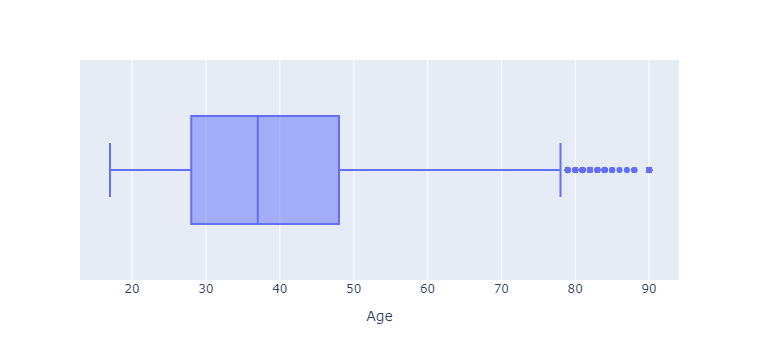

In [171]:
px.box(df, 'Age')

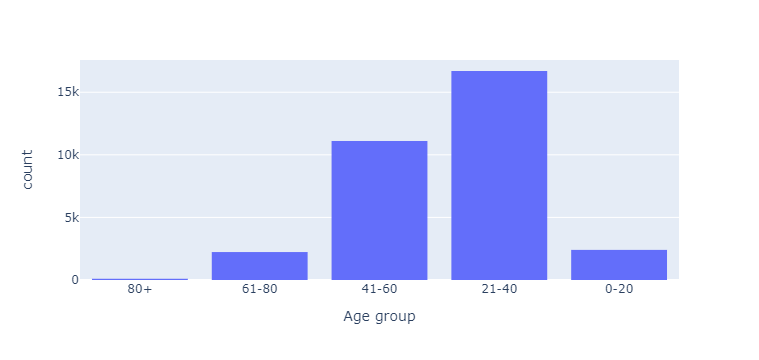

In [172]:
px.histogram(df, 'Age group')

- Age of people ranges from 17 to 90.
- 75% people are aged less than 48.


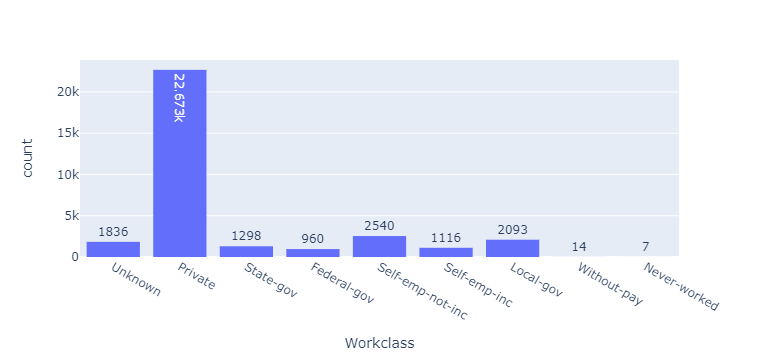

In [22]:
px.histogram(df, 'Workclass', text_auto=True)

- Nearly 70% of Workclass is Private.

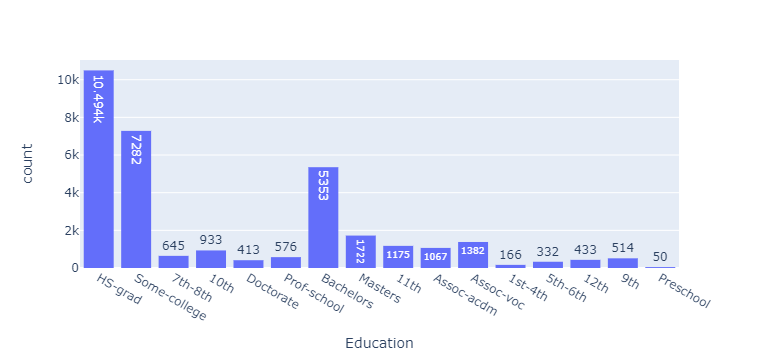

In [21]:
px.histogram(df, 'Education', text_auto=True)

In [180]:
df.describe(include=['object']).T

,count,unique,top,freq
Age group,32537,5,21-40,16696
Workclass,32537,9,Private,22673
Education,32537,16,HS-grad,10494
Marital Status,32537,5,Married,15411
Occupation,32537,15,Prof-specialty,4136
Relationship,32537,6,Husband,13187
Race,32537,5,White,27795
Sex,32537,2,Male,21775
Native.Country,32537,42,United-States,29153
Income,32537,2,<=50K,24698


* Income is our dependent variable and nearly 76% people earn less than equal to 50k.
* Nearly 85.4% of people belong to white race.
* Nearly 70% of Workclass is Private.
* Around 32% people have only studied till Highschool Grad.
* Around 90% people are Native-American.

In [183]:
col_str = df.select_dtypes(['object'])
print(col_str.columns)

Index(['Age group', 'Workclass', 'Education', 'Marital Status', 'Occupation',
       'Relationship', 'Race', 'Sex', 'Native.Country', 'Income'],
      dtype='object')


In [26]:
df.columns

Index(['Age', 'Age_group', 'Workclass', 'Education', 'Education_Num',
       'Marital_Status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_Gain', 'Capital_Loss', 'Hours_Per_Week', 'Native_Country',
       'Income'],
      dtype='object')

### Analyzing relation between the different variables.

#### Relationship between Age group and Income:

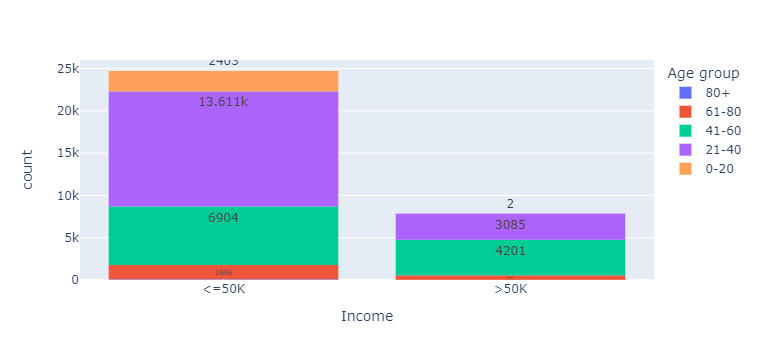

In [194]:
px.histogram(df, x = 'Income', color='Age group', text_auto=True)

- Nearly 76% people aged more than 60 yrs earns less than 50k.
- We are not seeling any significant impact of Age on Income so we need to further analyze it.

### Relationship between Marital Status and Income:

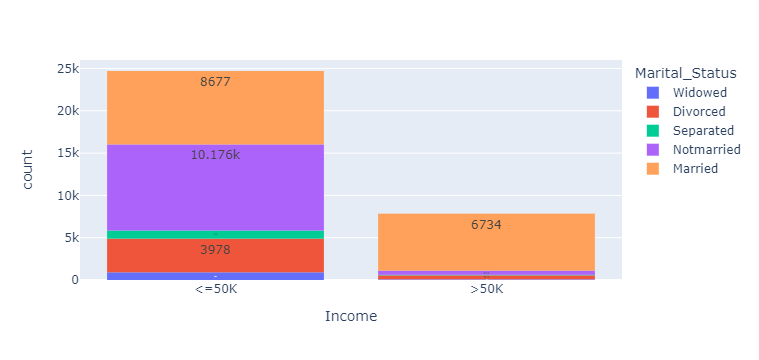

In [24]:
px.histogram(df, x="Income", color="Marital_Status", text_auto=True)

- Among all the people, married people contributes nearly 86% in the 'more than 50k' group. So Marital Status can be an important factor in deciding income range.

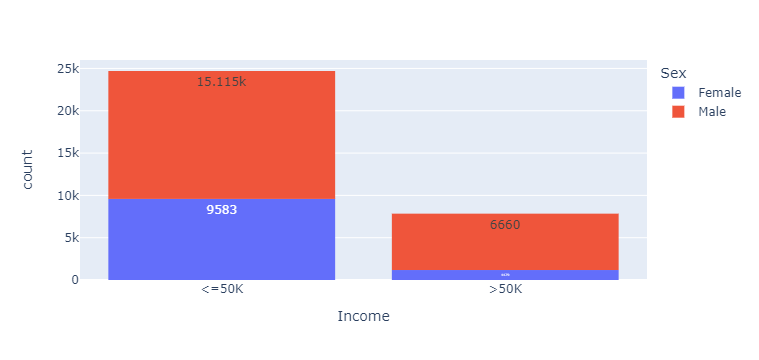

In [195]:
px.histogram(df, x="Income", color="Sex", text_auto=True)

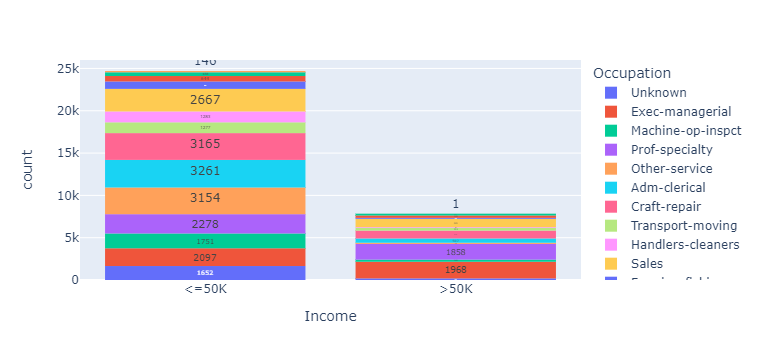

In [196]:
px.histogram(df, x="Income", color="Occupation", text_auto=True)

## Relation between Income and Workclass.

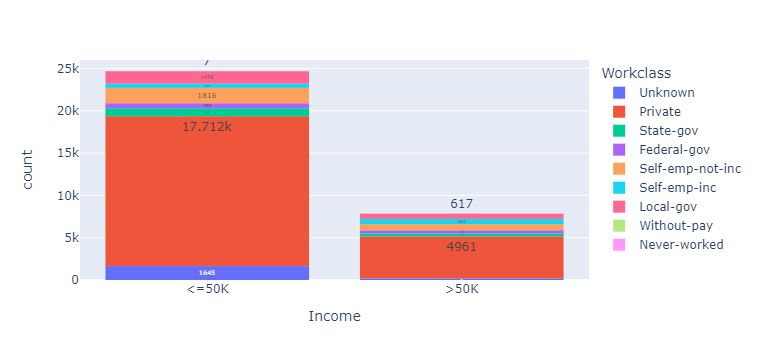

In [33]:
px.histogram(df, x="Income", color="Workclass", text_auto=True)

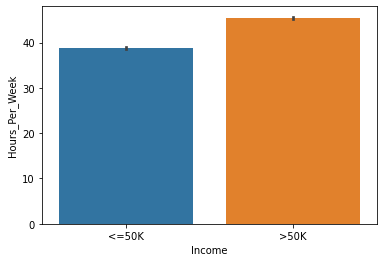

In [80]:
p = sns.barplot(data=df, x='Income', y='Hours_Per_Week')

- People earning more than 50k work more than people with income less than 50k.

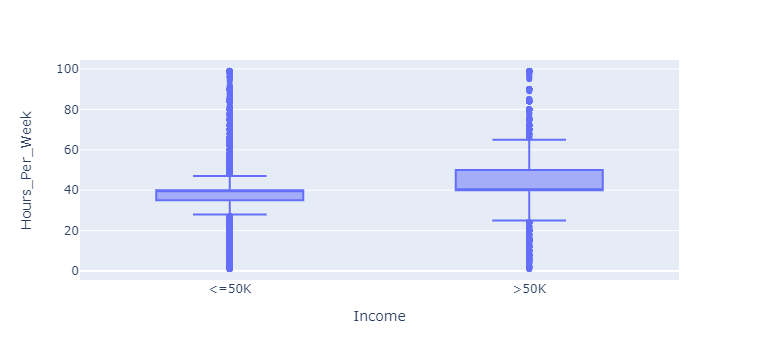

In [68]:
px.box(df, x='Income', y='Hours_Per_Week')

- Majority of people above 50k salary work more hours per week than people below 50k salary.


In [61]:
corr = df[numerical_col].corr()

<AxesSubplot:>

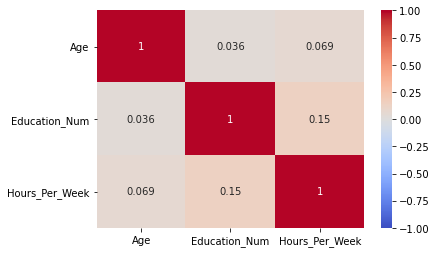

In [66]:
sns.heatmap(corr, annot=True,
            cmap= 'coolwarm',
            vmax=1, vmin=-1)

- High correlation is not found between any numerical column.